## The Bloch Sphere and Its Usage in Qiskit

### 1. [Installation and Setup](https://quantum.cloud.ibm.com/docs/en/guides/install-qiskit) 
```python
# Navigate to project directory and create a virtual environment with only Python installed in it. (Windows)
!python -m venv .venv

# Activate environment (using cmd)
.venv\Scripts\activate

# Install pip
!python -m pip install --upgrade pip

# Install Qiskit SDK, Qiskit Runtime and visualization
!pip install qiskit
!pip install qiskit-ibm-runtime
!pip install qiskit[visualization]

# If you want, install Jupyter notebook
!pip install jupyter

# Open the notebook:
!jupyter notebook <path/to/notebook.ipynb>
```

In [1]:
# Import the necessary libraries
from qiskit import QuantumCircuit, QuantumRegister
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_bloch_multivector, plot_bloch_vector
from qiskit.quantum_info import Statevector
import numpy as np

### 2. Theoretical Background — The Bloch Sphere

The **Bloch sphere** provides a geometric representation of a single qubit’s pure state.  
Any single-qubit state  
$$
|\psi\rangle = \cos(\tfrac{\theta}{2})|0\rangle + e^{i\phi}\sin(\tfrac{\theta}{2})|1\rangle
$$
can be represented by a point on the unit sphere with spherical coordinates $(\theta, \phi)$.  

| Basis | Qubit state | Bloch vector |
|:------|:----------------|:-------------|
| Z basis | $\ket{0}$ | $\hat{n} = (0, 0, 1)$ |
| Z basis | $\ket{1}$ | $\hat{n} = (0, 0, -1)$ |
| X basis | $\ket{+} = \tfrac{1}{\sqrt{2}}(\ket{0} + \ket{1})$ | $\hat{n} = (1, 0, 0)$ |
| X basis | $\ket{-} = \tfrac{1}{\sqrt{2}}(\ket{0} - \ket{1})$ | $\hat{n} = (-1, 0, 0)$ |
| Y basis | $\ket{+i} = \tfrac{1}{\sqrt{2}}(\ket{0} + i\ket{1})$ | $\hat{n} = (0, 1, 0)$ |
| Y basis | $\ket{-i} = \tfrac{1}{\sqrt{2}}(\ket{0} - i\ket{1})$ | $\hat{n} = (0, -1, 0)$ |



*(Based on [“Quantum Gates” § 2 – Bloch sphere representation of a qubit](https://threeplusone.com/pubs/on_gates.pdf))*  

---

### 3. Visualising Qubit States

Let’s start with the computational basis states.

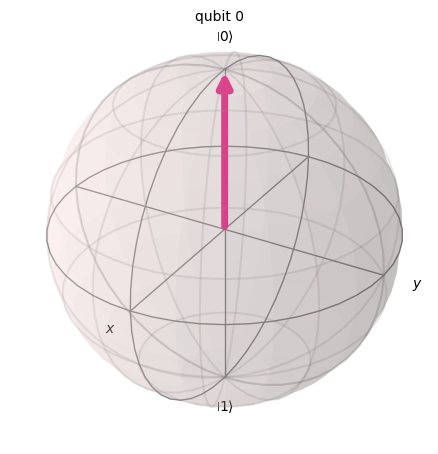

In [2]:
# |0> state
zero_state = Statevector.from_label('0')
plot_bloch_multivector(zero_state)

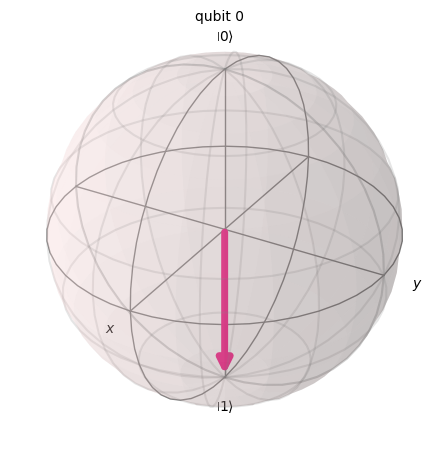

In [3]:
# |1> state
one_state = Statevector.from_label('1')
plot_bloch_multivector(one_state)

### 4. Creating Superposition States

Using the **Hadamard** gate ($H$-gate) to create $\ket{+}$ from $\ket{0}$:

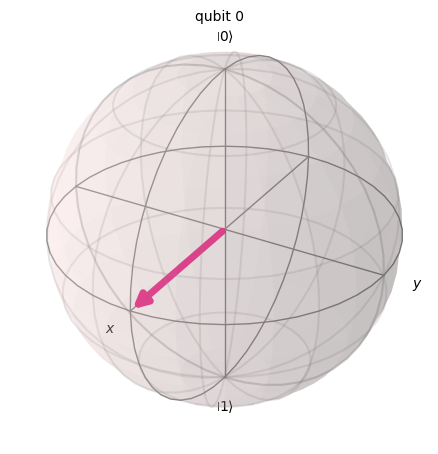

In [ ]:
# Superposition state: (1/sqrt(2))[|0> + |1>]
qc = QuantumCircuit(1)
qc.h(0)
state = Statevector.from_instruction(qc)
plot_bloch_multivector(state)

The $H$-gate rotates the Bloch vector from the north pole to south pole to the $+x$ axis, creating an equal superposition of $\ket{0}$ and $\ket{1}$ (where it will be used later for creating Bell (entanglement) state).

### 5. Rotations and Pauli Gates

Each single-qubit gate corresponds to a **rotation** of the Bloch vector.

| Gate | Axis | Rotation angle | Effect |
|:------|:------|:----------------|:--------|
| X | x-axis | $\pi$ | Flips $\ket{0}$ ↔ $\ket{1}$ |
| Y | y-axis | $\pi$ | Rotates about y |
| Z | z-axis | $\pi$ | Adds phase −1 to $\ket{1}$ |
| Rx(θ) | x-axis | θ | Arbitrary rotation |
| Ry(θ) | y-axis | θ | Arbitrary rotation |
| Rz(θ) | z-axis | θ | Arbitrary rotation |

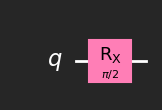

In [5]:
# Example: Rotate around the X-axis by π/2
qc = QuantumCircuit(1)
qc.rx(np.pi/2, 0)
qc.draw('mpl', style='iqp-dark')

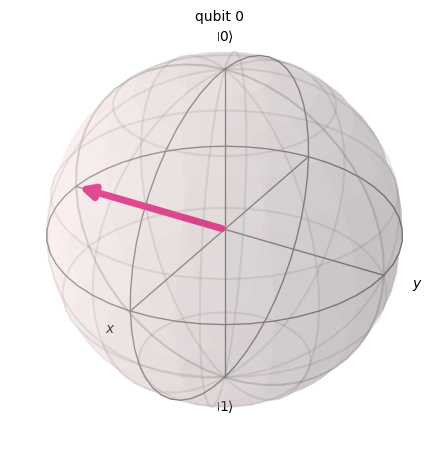

In [6]:
state = Statevector.from_instruction(qc)
plot_bloch_multivector(state)

### 6. Combining Rotations

We can apply consecutive rotations to see cumulative effects.

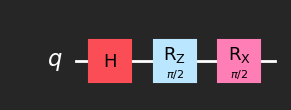

In [7]:
qc = QuantumCircuit(1)
qc.h(0)
qc.rz(np.pi/2, 0)
qc.rx(np.pi/2, 0)
qc.draw('mpl', style='iqp-dark')

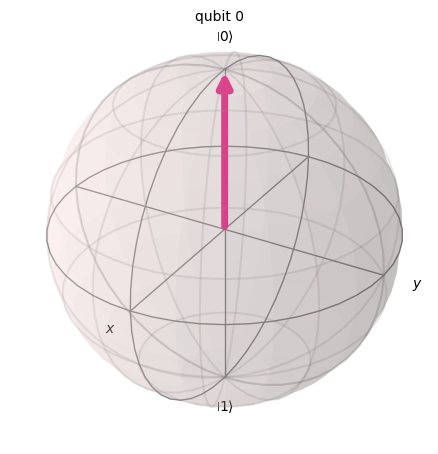

In [8]:
state = Statevector.from_instruction(qc)
plot_bloch_multivector(state)

Each unitary gate corresponds to a rotation of the Bloch vector.  
The Bloch sphere gives an intuitive way to **visualise how gates transform qubit states**.

### 7. Simulating and Measuring with AerSimulator

In [9]:
sim = AerSimulator()

qc = QuantumCircuit(1, 1)
qc.h(0)
qc.measure(0, 0)

result = sim.run(qc, shots=1024).result()
result.get_counts()

{'1': 482, '0': 542}

### 8. Animation of the Bloch vector

In [10]:
# create an empty quantum circuit
qr = QuantumRegister(1)
qc = QuantumCircuit(qr)

# add rotation gates to the circuit
qc.ry(np.pi/2,0)
qc.rz(np.pi/2,0)
qc.rx(np.pi/2,0)

# load the visdualization tool
from qiskit.visualization import visualize_transition

# generate a movie (it will be shown in next cell,
movie=visualize_transition(qc,fpg=20, spg=1)

C:\Users\tan\AppData\Local\Temp\ipykernel_19204\1470559907.py:14: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of Qiskit 1.2.0. It will be removed in the 2.0 release.
  movie=visualize_transition(qc,fpg=20, spg=1)


In [11]:
# Show the movie
movie

### 8. Exercises

1. Create and plot the states $\ket{+i}$ and $\ket{-i}$.  
2. Verify that $R_z(\pi/2)$ corresponds to a rotation about the z-axis.  
3. Show that the **T-gate** is a rotation of $\pi/4$ around the z-axis.  
4. Combine gates to reproduce Fig. 3.1 (“Pauli rotations of the Bloch sphere”) from *Quantum Gates.pdf*.

### 9. Further Reading

- *Qiskit Documentation*: [Quantum circuits and Bloch spheres](https://quantum.cloud.ibm.com/docs/en)  
- *Gavin E. Crooks*, [Quantum Gates – Tech Note 014](https://threeplusone.com/pubs/on_gates.pdf), § 2 – Bloch Sphere Representation of a Qubit  
- *Nielsen & Chuang*, *Quantum Computation and Quantum Information*, Ch. 1–2  